<a href="https://colab.research.google.com/github/seemazml/CycleGAN/blob/main/MRI%2BT1_T2%2BCycleGAN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Conversion from T1 weighted images to T2 weighted MRI image and vice-versa using CycleGAN

* In this Notebook we'll convert T1 weighted MRI image to T2 weighted image and vice versa using Cycle GAN Network.
* Below is the result that we want to achieve using CycleGANs.

### Pipeline
The Sequence of the Project

1. Importing Libraries
2. Data Loading and Visualization
3. Data Preprocessing
4. Model Building
5. Model Training
6. Generating a GIF

In [ ]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from skimage.transform import resize
from tensorflow import keras
from keras.utils.vis_utils import plot_model
import imageio
import glob
from glob import glob
import pathlib
import os
import cv2
import random
from numpy import asarray

### Data Loading and Visualization
1. Data Loading
2. Data Visualization

#### Data Loading

In [ ]:
## Mounting the google drive, use the following :
from google.colab import drive
drive.mount('/content/gdrive', force_remount=True)

Mounted at /content/gdrive


In [ ]:
#Setting up root path - Point your project root path
root_path = '/content/gdrive/MyDrive/MRI_T1_T2_Dataset/'

# Defining the path for train and test images
T1_img = pathlib.Path(os.path.join(root_path,"Tr1")) 
T2_img = pathlib.Path(os.path.join(root_path,"Tr2")) 

In [ ]:
# Define Batch Size
batch_size = 10
img_size = 256

**Load images and convert into arrays**

In [ ]:
### T1 Images

# ..//MRI_T1_T2_Dataset/Tr1/T1/*.png
images_T1 = glob(os.path.join(T1_img, "T1", "*.png"))

T1_img_arr = []

for img1 in images_T1:
  full_size_image_T1 = cv2.imread(img1, cv2.IMREAD_GRAYSCALE)
  T1_img_arr.append(cv2.resize(full_size_image_T1, (img_size,img_size)))

In [ ]:
### T2 Images

# ..//MRI_T1_T2_Dataset/Tr1/T1/*.png
images_T2 = glob(os.path.join(T2_img, "T2", "*.png"))

T2_img_arr = []

for img2 in images_T2:
  full_size_image_T2 = cv2.imread(img2,cv2.IMREAD_GRAYSCALE)
  T2_img_arr.append(cv2.resize(full_size_image_T2, (img_size,img_size)))

#### Data Visualization of T1 and T2 Images

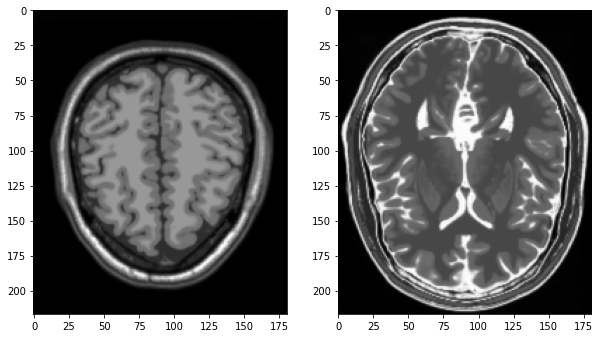

In [ ]:
r1 = random.sample(images_T1, 1)
r2 = random.sample(images_T2, 1)

# Matplotlib black magic
plt.figure(figsize=(10,10))
plt.subplot(121)
plt.imshow(cv2.imread(r1[0]))

plt.subplot(122)
plt.imshow(cv2.imread(r2[0]))

### Data Preprocessing
1.   Normalize
2.   Data Reshaping
3.   Batch and Shuffle Data

#### Normalize images to range [-1,1]

In [ ]:
T1_img_arr = (asarray(T1_img_arr)/127.5)-1.0 # Normalize the images to [-1.0, 1.0]
T1_img_arr.shape

(43, 256, 256)

In [ ]:
T2_img_arr = (asarray(T2_img_arr)/127.5)-1.0 # Normalize the images to [-1.0, 1.0]
T2_img_arr.shape

(46, 256, 256)

#### Reshape Images to (256, 256, 1) with float pixel values

In [ ]:
T1_data = T1_img_arr.reshape(T1_img_arr.shape[0], img_size, img_size, 1).astype('float32')
T2_data = T2_img_arr.reshape(T2_img_arr.shape[0], img_size, img_size, 1).astype('float32')

#### Batch and shuffle the data

In [ ]:
T1_data = tf.data.Dataset.from_tensor_slices(T1_data).shuffle(T1_img_arr.shape[0], seed=42).batch(batch_size)
T2_data = tf.data.Dataset.from_tensor_slices(T2_data).shuffle(T2_img_arr.shape[0], seed=42).batch(batch_size)

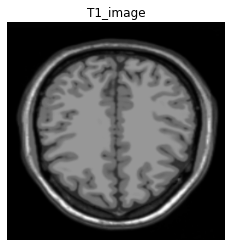

In [ ]:
sample_T1_data = next(iter(T1_data))
plt.figure(figsize=(4, 4))
plt.imshow(sample_T1_data[0].numpy()[:, :, 0], cmap='gray')
plt.title('T1_image')
plt.axis('off')
plt.show()

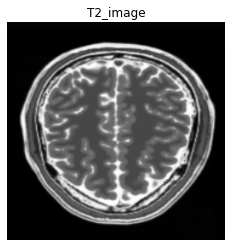

In [ ]:
sample_T2_data = next(iter(T2_data))
plt.figure(figsize=(4, 4))
plt.imshow(sample_T2_data[0].numpy()[:, :, 0], cmap='gray')
plt.title('T2_image')
plt.axis('off')
plt.show()

### Model Building
1. Instance Normalization
2. Downsampling, Upsampling and Unet
3. Generator Building using Unet
4. Discriminator Building

#### Instance Normalization
Instance Normalization are specially used with Style Transfer, where Separate Normalization is performed for each sample we perform channelwise Normalization.

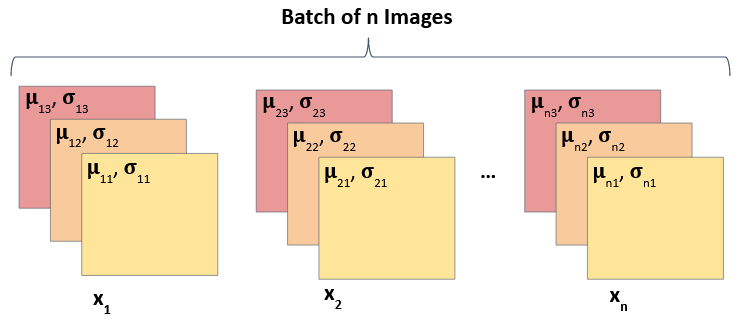

In [ ]:
class InstanceNormalization(tf.keras.layers.Layer):
    # Initialization of Objects
    def __init__(self, epsilon=1e-5):
        # calling parent's init
        super(InstanceNormalization, self).__init__()
        self.epsilon = epsilon
    
    def build(self, input_shape):
        self.scale = self.add_weight(
            name='scale',
            shape=input_shape[-1:],
            initializer=tf.random_normal_initializer(1., 0.02),
            trainable=True)
        self.offset = self.add_weight(
            name='offset',
            shape=input_shape[-1:],
            initializer='zeros',
            trainable=True)
    
    def call(self, x):
        # Compute Mean and Variance, Axes=[1,2] ensures Instance Normalization
        mean, variance = tf.nn.moments(x, axes=[1, 2], keepdims=True)
        inv = tf.math.rsqrt(variance + self.epsilon)
        normalized = (x - mean) * inv
        return self.scale * normalized + self.offset

#### Downsampling
Downsampling is performed using the Convolution, leading to reduce in dimensions.

In [ ]:
def downsample(filters, size, apply_norm=True):
    initializer = tf.random_normal_initializer(0., 0.02)
    result = tf.keras.Sequential()
    # Add Conv2d layer
    result.add(tf.keras.layers.Conv2D(filters, size, strides=2, padding='same',
                                      kernel_initializer=initializer, use_bias=False))
    # Add Normalization layer
    if apply_norm:
        result.add(InstanceNormalization())
    # Add Leaky Relu Activation
    result.add(tf.keras.layers.LeakyReLU())
    return result

#### Upsampling
Upsampling is a result of Transposed Convolution, where dimension of image are increased.

In [ ]:
def upsample(filters, size, apply_dropout=False):
    initializer = tf.random_normal_initializer(0., 0.02)
    result = tf.keras.Sequential()
    # Add Transposed Conv2d layer
    result.add(tf.keras.layers.Conv2DTranspose(filters, size, strides=2, padding='same',
                                               kernel_initializer=initializer, use_bias=False))
    # Add Normalization Layer
    result.add(InstanceNormalization())
    # Conditionally add Dropout layer
    if apply_dropout:
        result.add(tf.keras.layers.Dropout(0.5))
    # Add Relu Activation Layer
    result.add(tf.keras.layers.ReLU())
    return result

#### Unets
Unets takes Image as an input and translate it into another Image. <p>
To do this they first use Downsampling on Input Image to learn the latent characteristics of Input Image and then use Upsampling to use this knowledge to Translate it into another Image. <p>
Let's understand it through the below image.

<center>

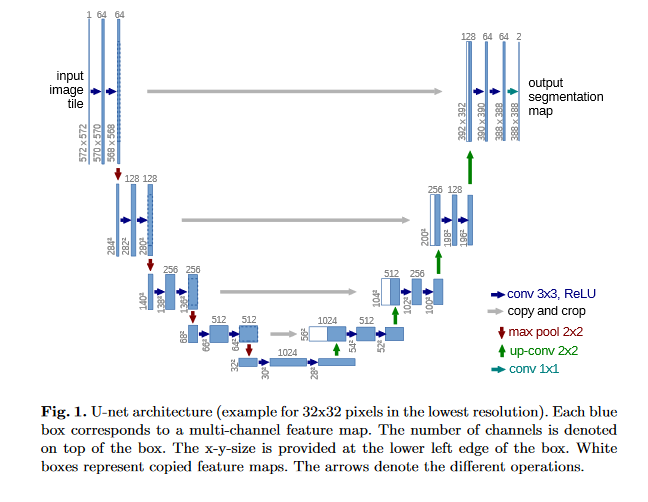

</center>

In [ ]:
# Unet Generator is a combination of Convolution + Transposed Convolution Layers
def unet_generator():
    down_stack = [
        downsample(128, 4, False),
        downsample(256, 4),
        downsample(256, 4),
        downsample(256, 4),
        downsample(256, 4)
    ]
    up_stack = [
        upsample(256, 4, True),
        upsample(256, 4, True),
        upsample(256, 4),
        upsample(128, 4)
    ]
    initializer = tf.random_normal_initializer(0., 0.02)
    last = tf.keras.layers.Conv2DTranspose(1, 4, strides=2, padding='same', kernel_initializer=initializer,
                                           activation='tanh') # (bs, 32, 32, 1)
    concat = tf.keras.layers.Concatenate()
    inputs = tf.keras.layers.Input(shape=[256, 256, 1])
    x = inputs
    # Downsampling through the model
    skips = []
    for down in down_stack:
        x = down(x)
        skips.append(x)
    
    skips = reversed(skips[:-1])
    # Upsampling and establishing the skip connections
    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = concat([x, skip])
    x = last(x)
    return tf.keras.Model(inputs=inputs, outputs=x)

#### Generator
Generator is a Unet Network here since We want to translate One type of Image (T1) into another type of Image (T2).

In [ ]:
generator_g = unet_generator()
generator_f = unet_generator()

Let's also visualize one of our Generator Models since Both our Generators have same architecture.

In [ ]:
generator_g.summary()

Model: "model_6"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_5 (InputLayer)            [(None, 256, 256, 1) 0                                            
__________________________________________________________________________________________________
sequential_40 (Sequential)      (None, 128, 128, 128 2048        input_5[0][0]                    
__________________________________________________________________________________________________
sequential_41 (Sequential)      (None, 64, 64, 256)  524800      sequential_40[0][0]              
__________________________________________________________________________________________________
sequential_42 (Sequential)      (None, 32, 32, 256)  1049088     sequential_41[0][0]              
____________________________________________________________________________________________

#### Discriminator
Discriminator is a traditional CNN, which we use to classify the Images. It only uses Downsampling hence.

Both Discriminators have same architecture

In [ ]:
# Discriminators only contain Convolutional Layers and no Transposed Convolution is not used 
def discriminator():
    initializer = tf.random_normal_initializer(0., 0.02)
    # add input layer of size (32, 32, 1)
    inp = tf.keras.layers.Input(shape=[256, 256, 1], name='input_image')
    x = inp
    
    # add downsampling step here
    down1 = downsample(64, 4, False)(x) # (bs, 16, 16, 64)
    down2 = downsample(128, 4)(down1) # (bs, 8, 8, 128)
    # add a padding layer here
    zero_pad1 = tf.keras.layers.ZeroPadding2D()(down2) # (bs, 10, 10, 128)
    
    # implement a concrete downsampling layer here
    conv = tf.keras.layers.Conv2D(256, 4, strides=1, kernel_initializer=initializer,
                                  use_bias=False)(zero_pad1) # (bs, 7, 7, 256)
    norm1 = InstanceNormalization()(conv)
    leaky_relu = tf.keras.layers.LeakyReLU()(norm1)
    
    # apply zero padding layer
    zero_pad2 = tf.keras.layers.ZeroPadding2D()(leaky_relu) # (bs, 9, 9, 256)
    
    # add a last pure 2D Convolution layer
    last = tf.keras.layers.Conv2D(1, 4, strides=1, kernel_initializer=initializer)(zero_pad2) # (bs, 6, 6, 1)
    return tf.keras.Model(inputs=inp, outputs=last)

In [ ]:
discriminator_x = discriminator()
discriminator_y = discriminator()

Have a look at Discriminator's architecture. The Dimensions are reducing overall at the end since it's a classifier and only Convolution layers are being used.

In [ ]:
discriminator_x.summary()

Model: "model_8"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_image (InputLayer)     [(None, 256, 256, 1)]     0         
_________________________________________________________________
sequential_58 (Sequential)   (None, 128, 128, 64)      1024      
_________________________________________________________________
sequential_59 (Sequential)   (None, 64, 64, 128)       131328    
_________________________________________________________________
zero_padding2d_4 (ZeroPaddin (None, 66, 66, 128)       0         
_________________________________________________________________
conv2d_40 (Conv2D)           (None, 63, 63, 256)       524288    
_________________________________________________________________
instance_normalization_53 (I (None, 63, 63, 256)       512       
_________________________________________________________________
leaky_re_lu_38 (LeakyReLU)   (None, 63, 63, 256)       0   

### Model Training
1. Declare Loss type
2. Calculate Discriminator Loss
3. Calculate Generator Loss
4. Cycle Loss
5. Identity Loss
6. Optimizer
7. Checkpoint Initialization
8. Training Flow

Check output of Untrained Generator models which should be a random noise

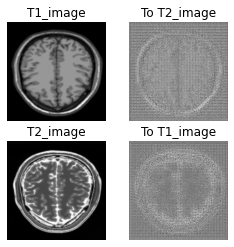

In [ ]:
to_T2_data = generator_g(sample_T1_data)
to_T1_data = generator_f(sample_T2_data)
plt.figure(figsize=(4, 4))

imgs = [sample_T1_data, to_T2_data, sample_T2_data, to_T1_data]
title = ['T1_image', 'To T2_image', 'T2_image', 'To T1_image']

for i in range(len(imgs)):
    plt.subplot(2, 2, i+1)
    plt.title(title[i])
    plt.imshow(imgs[i][0].numpy()[:, :, 0], cmap='gray')
    plt.axis('off')
plt.show()

#### Declare Loss as Binary Cross Entropy
Since Our Discriminator is a classifier

In [ ]:
loss_obj = tf.keras.losses.BinaryCrossentropy(from_logits=True)

#### Discriminator Loss
It consists of two types of losses
1.    Loss on Real Data
2.    Loss on Fake Data

In [ ]:
def discriminator_loss(real, generated):
    real_loss = loss_obj(tf.ones_like(real), real)
    generated_loss = loss_obj(tf.zeros_like(generated), generated)
    total_disc_loss = real_loss + generated_loss
    return total_disc_loss * 0.5 # mean of losses

#### Generator Loss
It has only one type of loss - Discriminator Loss on Generated data

In [ ]:
def generator_loss(generated):
    return loss_obj(tf.ones_like(generated), generated)

#### Cycle Loss
When we use both of Generators sequentially on a Input Image, we get Cycle Image and the L1 Loss between these two is called Cycle Loss.

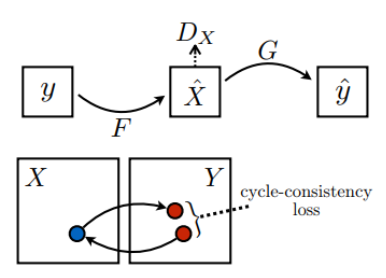

In [ ]:
def calc_cycle_loss(real_image, cycled_image):
    loss1 = tf.reduce_mean(tf.abs(real_image - cycled_image))
    return 10.0 * loss1

#### Identity Loss
When we provide input image to the Generator such that no translation is needed because the Image is already transformed. Here also we take L1 Loss between Input and Output Image.

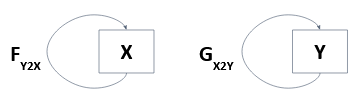

In [ ]:
def identity_loss(real_image, same_image):
    loss = tf.reduce_mean(tf.abs(real_image - same_image))
    return 0.5*loss

#### Optimizer 
We use Adam Optimizer to update weights which is a good optimizer to achieve quick learning.

In [ ]:
generator_g_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
generator_f_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

discriminator_x_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_y_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

We'll train out Model for 100 Epochs

In [ ]:
EPOCHS = 300

#### Checkpoint Initialization
Initialize checkpoints to save models

In [ ]:
checkpoint_path = "./Trained_Model"

ckpt = tf.train.Checkpoint(generator_g=generator_g,
                           generator_f=generator_f,
                           discriminator_x=discriminator_x,
                           discriminator_y=discriminator_y,
                           generator_g_optimizer=generator_g_optimizer,
                           generator_f_optimizer=generator_f_optimizer,
                           discriminator_x_optimizer=discriminator_x_optimizer,
                           discriminator_y_optimizer=discriminator_y_optimizer)

ckpt_manager = tf.train.CheckpointManager(ckpt, checkpoint_path, max_to_keep=3)

# if a checkpoint exists, restore the latest checkpoint.
if ckpt_manager.latest_checkpoint:
    ckpt.restore(ckpt_manager.latest_checkpoint)
    print ('Latest checkpoint restored!!')

Function to show Images output by Generators while Training

In [ ]:
def generate_images(model1, test_input1, model2, test_input2):
    prediction1 = model1(test_input1)
    prediction2 = model2(test_input2)
    plt.figure(figsize=(8, 4))
    display_list = [test_input1[0], prediction1[0], test_input2[0], prediction2[0]]
    title = ['Input Image', 'Predicted Image', 'Input Image', 'Predicted Image']
    for i in range(4):
        plt.subplot(1, 4, i+1)
        plt.title(title[i])
        plt.imshow(display_list[i].numpy()[:, :, 0], cmap='gray')
        plt.axis('off')

    plt.savefig('image_at_epoch_{:04d}.png'.format(epoch))
    plt.show()

#### Training FLow
Below Function performs one Flow of Batch Training <p>
Notice that Identity Loss and Cycle Loss are only used in training Generator and not Discriminator

Sequence of Training Flow


1.   Generate Fake Y and Cycled X
2.   Generate Fake X and Cycled Y
3.   Generate Fake Images through G and F for Identity Loss.
4.   Calculate Discriminator Loss for Disc X and Disc Y on Fake Data for Generator Training.
5.   Calculate Generator Loss on Discriminator.
6.   Calculate Cycled Loss on Cycled Images from step 1 and 2.
7.   Calculate Total Generator Loss - Disc Loss + Cycled Loss + Identity Loss
8.   Calculate Discriminator Loss on both Fake and Real Images for Disc X and Y for Disc Training.
9.   Calculate the Gradients and update the weight and bias of models.



In [ ]:
@tf.function
def train_step(real_x, real_y):
    # persistent is set to True because the tape is used more than
    # once to calculate the gradients.
    with tf.GradientTape(persistent=True) as tape:
        # Generator G translates X -> Y
        # Generator F translates Y -> X
        fake_y = generator_g(real_x, training=True)
        cycled_x = generator_f(fake_y, training=True)
        
        fake_x = generator_f(real_y, training=True)
        cycled_y = generator_g(fake_x, training=True)
        
        # same_x and same_y are used for identity loss.
        same_x = generator_f(real_x, training=True)
        same_y = generator_g(real_y, training=True)
        
        disc_real_x = discriminator_x(real_x, training=True)
        disc_real_y = discriminator_y(real_y, training=True)
        
        disc_fake_x = discriminator_x(fake_x, training=True)
        disc_fake_y = discriminator_y(fake_y, training=True)
        
        # calculate the loss
        gen_g_loss = generator_loss(disc_fake_y)
        gen_f_loss = generator_loss(disc_fake_x)
        
        total_cycle_loss = calc_cycle_loss(real_x, cycled_x) + calc_cycle_loss(real_y, cycled_y)
        
        # Total generator loss = BCE loss + cycle loss + identity loss
        total_gen_g_loss = gen_g_loss + total_cycle_loss + identity_loss(real_y, same_y)
        total_gen_f_loss = gen_f_loss + total_cycle_loss + identity_loss(real_x, same_x)
        
        # Discriminator's loss
        disc_x_loss = discriminator_loss(disc_real_x, disc_fake_x)
        disc_y_loss = discriminator_loss(disc_real_y, disc_fake_y)
        
    # Calculate the gradients for generator and discriminator
    generator_g_gradients = tape.gradient(total_gen_g_loss, generator_g.trainable_variables)
    generator_f_gradients = tape.gradient(total_gen_f_loss, generator_f.trainable_variables)
    
    discriminator_x_gradients = tape.gradient(disc_x_loss, discriminator_x.trainable_variables)
    discriminator_y_gradients = tape.gradient(disc_y_loss, discriminator_y.trainable_variables)
    
    # Apply the gradients to the optimizer
    generator_g_optimizer.apply_gradients(zip(generator_g_gradients, generator_g.trainable_variables))
    generator_f_optimizer.apply_gradients(zip(generator_f_gradients, generator_f.trainable_variables))
    
    discriminator_x_optimizer.apply_gradients(zip(discriminator_x_gradients, discriminator_x.trainable_variables))
    discriminator_y_optimizer.apply_gradients(zip(discriminator_y_gradients, discriminator_y.trainable_variables))

#### Train the CycleGAN Model for several Epochs
Loop training function for number of epochs and also show the output at each step. <p>
Note how Generators are getting better at producing realistic images epoch by epoch

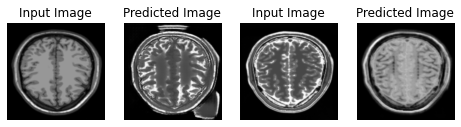

Saving checkpoint for epoch 227 at ./Trained_Model/ckpt-233


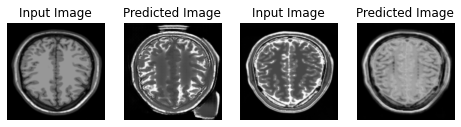

Saving checkpoint for epoch 228 at ./Trained_Model/ckpt-234


KeyboardInterrupt: ignored

In [ ]:
for epoch in range(1, EPOCHS+1):
    for image_x, image_y in tf.data.Dataset.zip((T1_data, T2_data)):
        train_step(image_x, image_y)
    generate_images(generator_g, sample_T1_data, generator_f, sample_T2_data)
    ckpt_save_path = ckpt_manager.save()
    print('Saving checkpoint for epoch', epoch, 'at', ckpt_save_path)

### Generating a GIF for visualization of Results

In [ ]:
import glob

In [ ]:
anim_file = 'cyclegan.gif'

with imageio.get_writer(anim_file, mode='I') as writer:
  filenames = glob.glob('image*.png')
  filenames = sorted(filenames)
  for filename in filenames:
    image = imageio.imread(filename)
    writer.append_data(image)
  image = imageio.imread(filename)
  writer.append_data(image)

In [ ]:
pip install git+https://github.com/tensorflow/docs

  Cloning https://github.com/tensorflow/docs to /tmp/pip-req-build-s9h0s5y_
  Running command git clone -q https://github.com/tensorflow/docs /tmp/pip-req-build-s9h0s5y_
  Created wheel for tensorflow-docs: filename=tensorflow_docs-0.0.0b993e77054dcafbd8b0da0a9d6f9ad7c10975901_-py3-none-any.whl size=154388 sha256=366d8c97654dd370180577514b0ea304850108e54227ead8932b0b7a65df2193
  Stored in directory: /tmp/pip-ephem-wheel-cache-tvj7cmbt/wheels/cc/c4/d8/5341e93b6376c5c929c49469fce21155eb69cef1a4da4ce32c
Failed to build tensorflow-docs
    Running setup.py install for tensorflow-docs ... done
  DEPRECATION: tensorflow-docs was installed using the legacy 'setup.py install' method, because a wheel could not be built for it. A possible replacement is to fix the wheel build issue reported above. You can find discussion regarding this at https://github.com/pypa/pip/issues/8368.



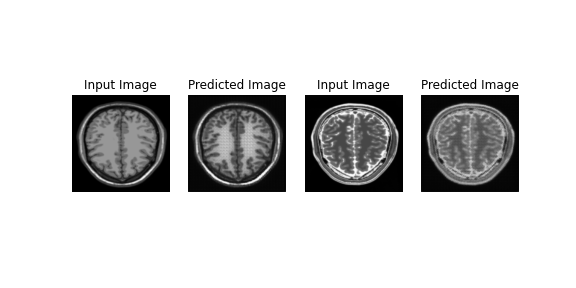

In [ ]:
import tensorflow_docs.vis.embed as embed
embed.embed_file(anim_file)